In [ ]:
%%writefile requirements.txt
voila
ipywidgets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 65.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 90.6 MB/s eta 0:00:00
  Attempting uninstall: cachetools
    Found existing installation: cachetools 7.0.0
    Uninstalling cachetools-7.0.0:
      Successfully uninstalled cachetools-7.0.0


In [ ]:
https://mybinder.org/v2/gh/daoudgarcon-lgtm/EchoPrimeTest/HEAD

In [ ]:
import ipywidgets as widgets

upload = widgets.FileUpload(
    accept='',
    multiple=True
)

display(upload)

In [34]:
from IPython.display import display, HTML

display(HTML("""
<h3>Step 1: Upload Files</h3>
<p>
Click the <b>📁 File Browser</b> icon (left sidebar),
then click <b>Upload</b> and select multiple files.
</p>
<p>
After uploading, run the next cell.
</p>
"""))

In [ ]:
import os

uploaded_files = [
    f for f in os.listdir()
    if os.path.isfile(f)
]

print("Detected files:")
for f in uploaded_files:
    print(" -", f)

In [32]:
import ipywidgets as widgets
import os

button = widgets.Button(description="Refresh File List")
output = widgets.Output()

def refresh(b):
    with output:
        output.clear_output()
        print("Files in directory:")
        for f in os.listdir():
            print(" -", f)

button.on_click(refresh)

display(button, output)

Button(description='Refresh File List', style=ButtonStyle())

Output()

In [ ]:
import os

print("Current directory:", os.getcwd())
print("\nUploaded files:")

for f in os.listdir():
    print(" -", f)

In [ ]:
print(type(upload.value))
print(upload.value)

In [ ]:
!pwd
%cd content
!pwd

/
/content
/content


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!git clone https://github.com/echonet/EchoPrime

In [ ]:
!wget https://github.com/echonet/EchoPrime/releases/download/v1.0.0/model_data.zip
!wget https://github.com/echonet/EchoPrime/releases/download/v1.0.0/candidate_embeddings_p1.pt
!wget https://github.com/echonet/EchoPrime/releases/download/v1.0.0/candidate_embeddings_p2.pt
!unzip model_data.zip
!mv candidate_embeddings_p1.pt model_data/candidates_data/
!mv candidate_embeddings_p2.pt model_data/candidates_data/

--2026-02-07 21:18:18--  https://github.com/echonet/EchoPrime/releases/download/v1.0.0/model_data.zip
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/849521117/32015e93-717c-4c2d-b075-b4892511b596?sp=r&sv=2018-11-09&sr=b&spr=https&se=2026-02-07T22%3A07%3A47Z&rscd=attachment%3B+filename%3Dmodel_data.zip&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2026-02-07T21%3A07%3A29Z&ske=2026-02-07T22%3A07%3A47Z&sks=b&skv=2018-11-09&sig=OujrY9XuOgcMCLvgOrolV5Vrpc93yUFkbx7vi%2Fd3b%2F4%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc3MDUwMjY5OCwibmJmIjoxNzcwNDk5MDk4LCJwYXRoIjoicmVsZWFzZWFzc2V0cHJvZHVjdGlvbi5ibG

In [ ]:
%%writefile EchoPrime/requirements.txt
ipywidgets==8.1.2
mysql-connector-python==8.0.31
opencv-python-headless==4.5.5.64
polars==0.15.14
pydicom==2.3.1
pytorch-lightning==2.2.0.post0
PyWavelets==1.5.0
wandb==0.16.3
transformers==4.57.0

Overwriting EchoPrime/requirements.txt


In [ ]:
!pip install -r EchoPrime/requirements.txt
!pip install av

In [ ]:
!mv echo_test EchoPrime/echo_test
%cd EchoPrime
!pwd

/content/EchoPrime
/content/EchoPrime


In [ ]:
INPUT = "echo_test"
from echo_prime import EchoPrime

/content/EchoPrime/utils/utils.py:165: SyntaxWarning: invalid escape sequence '\('
  sec[idx]=sec[idx].replace('(', '\(').replace(')', '\)').replace("+",'\+')
/content/EchoPrime/utils/utils.py:165: SyntaxWarning: invalid escape sequence '\)'
  sec[idx]=sec[idx].replace('(', '\(').replace(')', '\)').replace("+",'\+')
/content/EchoPrime/utils/utils.py:165: SyntaxWarning: invalid escape sequence '\+'
  sec[idx]=sec[idx].replace('(', '\(').replace(')', '\)').replace("+",'\+')


In [ ]:
%cd ..
!mv model_data EchoPrime/model_data
%cd EchoPrime
ep = EchoPrime()

/content
/content/EchoPrime


100%|██████████| 1230676/1230676 [00:21<00:00, 56887.87it/s]


100%|██████████| 55/55 [00:30<00:00,  1.78it/s]


Preprocessed and normalized video inputs


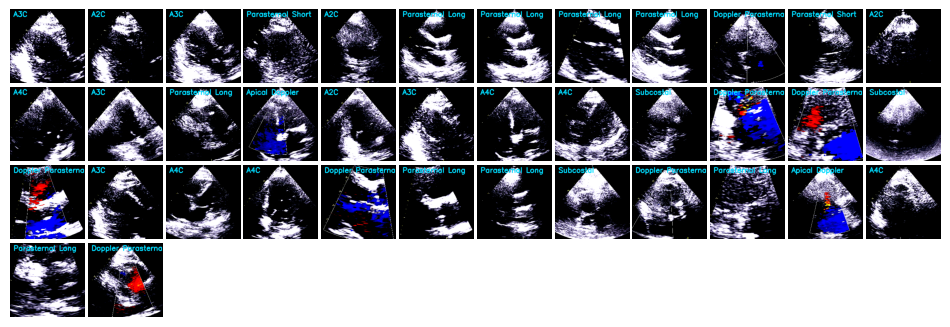

In [ ]:
#INPUT = "model_data/example_study"
stack_of_videos = ep.process_dicoms(INPUT)
encoded_study=ep.encode_study(stack_of_videos, visualize=True)

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import warnings
import logging

# Silence Python warnings (still useful for some cases)
warnings.simplefilter("ignore")

# Silence matplotlib loggers (this is the key)
#logging.getLogger("matplotlib").setLevel(logging.ERROR)
#logging.getLogger("matplotlib.animation").setLevel(logging.ERROR)

# number of videos = first dimension
num_videos = stack_of_videos.shape[0]

videos_np = []

for ind in range(num_videos):
    vid = stack_of_videos[ind]

    if vid.dim() > 4:
        vid = vid[0]

    # (C, T, H, W) → (T, H, W, C)
    video_np = vid.permute(1, 2, 3, 0).cpu().numpy()
    videos_np.append(video_np)

num_frames = videos_np[0].shape[0]

fig, axes = plt.subplots(
    1, num_videos,
    figsize=(4 * num_videos, 4),
    squeeze=False
)

# remove ALL padding
fig.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0)

axes = axes[0]
ims = []

for ax, video in zip(axes, videos_np):
    ax.axis("off")
    im = ax.imshow(video[0])
    ims.append(im)

plt.close()
print("check")
def animate(i):
    for im, video in zip(ims, videos_np):
        im.set_data(video[i])
    return ims

anim = animation.FuncAnimation(
    fig,
    animate,
    frames=num_frames,
    interval=50,
    blit=True
)

HTML(anim.to_html5_video())

check


In [ ]:
rprt=ep.generate_report(encoded_study)
print(*(rprt.split(sep='[SEP]')),sep='\n')

Left Ventricle: Mild septal hypertrophy; the remaining wall thickness is normal. Overall left ventricular systolic function is normal Left ventricular systolic function is normal, with an estimated ejection fraction of 68.59 to 68.59 %. No evidence of thrombus There is grade I diastolic dysfunction. 
Resting Segmental Wall Motion Analysis: Total wall motion score is 1.0. 
Right Ventricle: Normal right ventricular systolic function. 
Left Atrium: Unable to rule out left atrial thrombus. 
Right Atrium: There is no evidence of right atrial thrombus. 
Atrial Septum: No shunt by color Doppler. 
Mitral Valve: Mitral valve leaflets appear mildly thickened. No mitral valve stenosis 
Aortic Valve: Trileaflet aortic valve. Aortic cusps appear moderately calcified. 
Tricuspid Valve: There is trivial tricuspid regurgitation. No tricuspid stenosis 
Pulmonic Valve: No evidence of pulmonic regurgitation. 
Pericardium: No echocardiographic evidence to suggest cardiac tamponade. 
Aorta: Normal aortic r

In [ ]:
print("Feature logits")
ep.predict_metrics(encoded_study)

Feature logits


{'impella': 0.0,
 'ejection_fraction': 54.02617647058825,
 'pacemaker': 0.0,
 'rv_systolic_function_depressed': 0.02,
 'right_ventricle_dilation': 0.0,
 'left_atrium_dilation': 0.02,
 'right_atrium_dilation': 0.0,
 'mitraclip': 0.0,
 'mitral_annular_calcification': 0.02,
 'mitral_stenosis': 0.0,
 'mitral_regurgitation': 0.08,
 'tavr': 0.0,
 'bicuspid_aov_morphology': 0.0,
 'aortic_stenosis': 0.02,
 'aortic_regurgitation': 0.0,
 'tricuspid_stenosis': 0.0,
 'tricuspid_valve_regurgitation': 0.0,
 'pericardial_effusion': 0.0,
 'aortic_root_dilation': 0.0,
 'dilated_ivc': 0.24,
 'pulmonary_artery_pressure_continuous': 35.10782608695652}

In [ ]:
#%cd ..
#import shutil
#import os
#shutil.rmtree("content/EchoPrime")
#shutil.rmtree("content/__MACOSX")